# Chicago transportation day1

## Imports

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime
from datetime import datetime, timedelta
import numpy as np
import plotly.offline as pyo
import plotly.graph_objs as go
from plotly import tools
pyo.init_notebook_mode(connected=True)
import plotly.figure_factory as ff
from sklearn.cluster import KMeans
import geopandas as gpd
import folium
from shapely.geometry import Point
import shapely.wkt
from shapely.geometry import Polygon

## Load data

In [17]:
df = pd.read_csv('/Users/alex/Documents/Transportation_Network_Providers_-_Trips.csv', usecols=['Trip Start Timestamp', 'Trip End Timestamp', 'Trip Seconds',  'Trip Miles', 'Pickup Census Tract', 'Dropoff Census Tract', 'Pickup Community Area', 'Dropoff Community Area', 'Fare', 'Tip', 'Additional Charges', 'Trip Total', 'Shared Trip Authorized', 'Trips Pooled', 'Pickup Centroid Latitude', 'Pickup Centroid Longitude', 'Pickup Centroid Location', 'Dropoff Centroid Latitude', 'Dropoff Centroid Longitude', 'Dropoff Centroid Location'], nrows = 300000)
chicago = gpd.read_file('/Users/alex/Documents/Boundaries - Community Areas (current).geojson')

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300000 entries, 0 to 299999
Data columns (total 20 columns):
Trip Start Timestamp          300000 non-null object
Trip End Timestamp            300000 non-null object
Trip Seconds                  300000 non-null int64
Trip Miles                    300000 non-null float64
Pickup Census Tract           210676 non-null float64
Dropoff Census Tract          209071 non-null float64
Pickup Community Area         281992 non-null float64
Dropoff Community Area        279447 non-null float64
Fare                          300000 non-null float64
Tip                           300000 non-null int64
Additional Charges            300000 non-null float64
Trip Total                    300000 non-null float64
Shared Trip Authorized        300000 non-null bool
Trips Pooled                  300000 non-null int64
Pickup Centroid Latitude      282149 non-null float64
Pickup Centroid Longitude     282149 non-null float64
Pickup Centroid Location      282149

## Cleaning data

In [19]:
df['Trip Start Timestamp'] = df['Trip Start Timestamp'].apply(lambda t: pd.to_datetime(t, format='%m/%d/%Y %I:%M:%S %p'))
df['Trip End Timestamp'] = df['Trip End Timestamp'].apply(lambda t: pd.to_datetime(t, format='%m/%d/%Y %I:%M:%S %p'))




## Upload Chicago districts

In [20]:
chicago = gpd.read_file('/Users/alex/Documents/Boundaries - Community Areas (current).geojson')

## DF cleaning

### Number of pickups per location

In [21]:
df[df['Pickup Community Area']==7.0].resample('H', on='Trip Start Timestamp').size()

Trip Start Timestamp
2018-11-01 00:00:00     504
2018-11-01 01:00:00     510
2018-11-01 02:00:00     303
2018-11-01 03:00:00     171
2018-11-01 04:00:00     147
2018-11-01 05:00:00     196
2018-11-01 06:00:00     471
2018-11-01 07:00:00     802
2018-11-01 08:00:00     964
2018-11-01 09:00:00     818
2018-11-01 10:00:00     474
2018-11-01 11:00:00     421
2018-11-01 12:00:00     354
2018-11-01 13:00:00     512
2018-11-01 14:00:00     410
2018-11-01 15:00:00     481
2018-11-01 16:00:00     592
2018-11-01 17:00:00     789
2018-11-01 18:00:00    1191
2018-11-01 19:00:00    1182
2018-11-01 20:00:00     850
2018-11-01 21:00:00    1033
2018-11-01 22:00:00    1010
2018-11-01 23:00:00     746
2018-11-02 00:00:00     493
2018-11-02 01:00:00     355
2018-11-02 02:00:00      79
Freq: H, dtype: int64

In [ ]:
dropoff_area = df[df['Dropoff Community Area']==8.0].resample('H', on='Trip End Timestamp').size()

In [ ]:
type(dropoff_area)

pandas.core.series.Series

In [ ]:
trace = go.Bar(x=dropoff_area.index, y=dropoff_area)

layout = go.Layout(
    title='Dropoff in area 7',
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
pyo.iplot(fig)

## dayly descriptive analysis

 - Number of rides per day
 - Number of rides per hour (get model parameters)
 - Average numper of miles per trip per hour
 - Average fare per trip
 - Total revenue per hour
 - rides velocity distribution
 - $/per minute analysis. most profitabe directions and time
 - rides out of city area
 - rides in city area
 - rides within one districts

## statistics per distirict

 - number of pickups per district (choropleth)
 - revenue per pickup district (choropleth)
 - distributon pickups per hour per districts
 - define scarcity areas
 - distribution pickups, dropoffs and pickups minus dropoff 

# 1. Number of rides per day in Chicago

In [12]:
rides_per_day = pd.DataFrame(df.resample('D', on='Trip Start Timestamp').size()).reset_index()

In [13]:
rides_per_hour = pd.DataFrame(df.resample('H', on='Trip Start Timestamp').size()).reset_index()
rides_per_hour.columns = ['Timeline', 'Number of trips']

In [14]:
trace = go.Bar(x=rides_per_hour['Timeline'], y=rides_per_hour['Number of trips'])

layout = go.Layout(
    title='Number of Rides Per Hour',
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
pyo.iplot(fig)

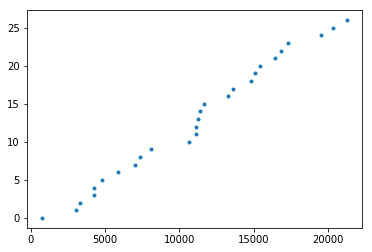

In [15]:
plt.plot(rides_per_hour['Number of trips'].sort_values(), rides_per_hour.index, marker = '.', linestyle = 'none')
plt.show()

# Median number of miles per trip per hour

In [14]:
ride_miles_per_hour = pd.DataFrame(df.resample('H', on='Trip Start Timestamp')['Trip Miles'].median()).reset_index()

In [15]:
trace = go.Bar(x=ride_miles_per_hour['Trip Start Timestamp'], y=ride_miles_per_hour['Trip Miles'])

layout = go.Layout(
    title='Average miles per hour',
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
pyo.iplot(fig)

# Median fare per trip

In [16]:
ride_fare_per_hour = pd.DataFrame(df.resample('H', on='Trip Start Timestamp').Fare.median()).reset_index()

In [17]:
trace = go.Bar(x=ride_fare_per_hour['Trip Start Timestamp'], y=ride_fare_per_hour.Fare)

layout = go.Layout(
    title='Median fare per trip',
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
pyo.iplot(fig)

# Total Revenue (Fare + Additional charges)

In [18]:
total_fare_per_day = df.Fare.sum()

In [21]:
total_fare_per_day

3367032.5

In [22]:
total_add_charges_per_day = df['Additional Charges'].sum()

In [23]:
total_add_charges_per_day

860523.5199999999

# Revenue per hour distribution

In [24]:
ride_fare_per_hour = pd.DataFrame(dfc.Fare.sum()).reset_index()
ride_charge_per_hour = pd.DataFrame(df.resample('H', on='Trip Start Timestamp')['Additional Charges'].sum()).reset_index()

In [25]:
trace1 = go.Bar(
    x=ride_fare_per_hour['Trip Start Timestamp'],
    y=ride_fare_per_hour.Fare,
    name='Fare'
)
trace2 = go.Bar(
    x=ride_charge_per_hour['Trip Start Timestamp'],
    y=ride_charge_per_hour['Additional Charges'],
    name='Additonal Charges'
)

data = [trace1, trace2]
layout = go.Layout(
    barmode='stack'
)

fig = go.Figure(data=data, layout=layout)
pyo.iplot(fig, filename='stacked-bar')

# Ride velocity

In [26]:
df['velocity'] = df['Trip Miles']/(df['Trip Seconds']/3600)

In [27]:
ride_velocity = pd.DataFrame(df.resample('H', on='Trip Start Timestamp').velocity.median()).reset_index()

In [28]:
trace = go.Bar(x=ride_velocity['Trip Start Timestamp'], y=ride_velocity.velocity)

layout = go.Layout(
    title='Median Velocity',
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
pyo.iplot(fig)

# Revenue per minute

In [29]:
df_test = df[df['Trip Seconds']!=0]

In [30]:
df_reven = df_test[df['Fare']!=0]

/Users/alex/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [31]:
df_reven['rev_min'] = df_reven.Fare/(df_reven['Trip Seconds']/60)

### Basic stats: revenue per ride minute 

In [32]:
df_reven['rev_min'].describe()

count    296197.000000
mean          0.651692
std           0.789013
min           0.012739
25%           0.499168
50%           0.624480
75%           0.769231
max         212.500000
Name: rev_min, dtype: float64

# Rides destinations (null to city, city to null, null to null, city dif areas, city same area)

In [33]:
null_rides = df[df['Dropoff Community Area'].isnull() & df['Pickup Community Area'].isnull()]

null_dropoff = df[df['Dropoff Community Area'].isnull() & df['Pickup Community Area'].notnull()]

null_pickup = df[df['Pickup Community Area'].isnull() & df['Dropoff Community Area'].notnull()]

same_area = df[df['Dropoff Community Area']==df['Pickup Community Area']]

differnt_area = df[df['Dropoff Community Area']!=df['Pickup Community Area']]

city_dif_area = differnt_area[~differnt_area.index.isin(null_dropoff.index)]

city_dif_area = city_dif_area[~city_dif_area.index.isin(null_pickup.index)]

city_dif_area = city_dif_area[~city_dif_area.index.isin(null_rides.index)]

same_city_area = same_area[~same_area.index.isin(null_rides.index)]

In [34]:
labels = ['Rides without area destinations','Rides without dropoff','Rides without pickups','Rides between city areas', 'Rides within same city areas']
values = [len(null_rides),len(null_dropoff),len(null_pickup),len(city_dif_area), len(same_city_area)]
colors = ['#FEBFB3', '#E1396C', '#96D38C', '#D0F9B1', '#b3fec1']

trace = go.Pie(labels=labels, values=values,
               hoverinfo='label+percent', textinfo='value', 
               textfont=dict(size=20),
               marker=dict(colors=colors, 
                           line=dict(color='#000000', width=2)))

pyo.iplot([trace], filename='styled_pie_chart')

In [35]:
null_pickup_time = pd.DataFrame(null_pickup.resample('H', on='Trip Start Timestamp').size()).reset_index()
null_pickup_time.columns = ['Trip Start Timestamp', 'Count']

In [36]:
trace = go.Bar(x=null_pickup_time['Trip Start Timestamp'], y=null_pickup_time['Count'])

layout = go.Layout(
    title='Rides without Pickup Data',
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
pyo.iplot(fig)

In [37]:
null_dropoff_time = pd.DataFrame(null_dropoff.resample('H', on='Trip Start Timestamp').size()).reset_index()
null_dropoff_time.columns = ['Trip Start Timestamp', 'Count']

In [38]:
trace = go.Bar(x=null_dropoff_time['Trip Start Timestamp'], y=null_dropoff_time['Count'])

layout = go.Layout(
    title='Reides without dropoff data',
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
pyo.iplot(fig)

In [39]:
same_city_area_time = pd.DataFrame(same_city_area.resample('H', on='Trip Start Timestamp').size()).reset_index()
same_city_area_time.columns = ['Trip Start Timestamp', 'Count']

In [40]:
trace = go.Bar(x=same_city_area_time['Trip Start Timestamp'], y=same_city_area_time['Count'])

layout = go.Layout(
    title='Rides within the same Community Areas',
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
pyo.iplot(fig)

In [41]:
city_dif_area_time = pd.DataFrame(city_dif_area.resample('H', on='Trip Start Timestamp').size()).reset_index()
city_dif_area_time.columns = ['Trip Start Timestamp', 'Count']

In [42]:
trace = go.Bar(x=city_dif_area_time['Trip Start Timestamp'], y=city_dif_area_time['Count'])

layout = go.Layout(
    title='Rides between differend Community Areas',
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
pyo.iplot(fig)

# Number of pickups and dropoffs per district (choropleth)

In [43]:
pickup_per_area = pd.DataFrame(df.groupby('Pickup Community Area').size()).reset_index()

pickup_per_area['community_area'] = pickup_per_area['Pickup Community Area'].astype(int)
pickup_per_area = pickup_per_area.drop(columns='Pickup Community Area')
pickup_per_area.columns = ['pickup_number', 'community_area']

In [44]:
dropoff_per_area = pd.DataFrame(df.groupby('Dropoff Community Area').size()).reset_index()

dropoff_per_area['community_area'] = dropoff_per_area['Dropoff Community Area'].astype(int)
dropoff_per_area = dropoff_per_area.drop(columns='Dropoff Community Area')
dropoff_per_area.columns = ['dropoff_number', 'community_area']

In [45]:
chicago['community_area'] = chicago['area_num_1'].astype(int)

chicago = pd.merge(chicago, pickup_per_area, how='left', on='community_area')

chicago = pd.merge(chicago, dropoff_per_area, how='left', on='community_area')

In [46]:
chicago_center = [41.8781, -87.6298]

pickup_map = folium.Map(location = chicago_center, zoom_start = 10)

In [47]:
folium.Choropleth(
    geo_data=chicago,
    name='geometry',
    data=chicago,
    columns=['area_numbe', 'pickup_number'],
    key_on='feature.properties.area_numbe',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.5,
    legend_name='Pickup dencity'
).add_to(pickup_map)

In [48]:
folium.LayerControl().add_to(pickup_map)

In [49]:
display(pickup_map)

In [50]:
import mapclassify

# Pickup Folium Choropleth

In [51]:
bins = list(chicago['pickup_number'].quantile([0, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]))

In [52]:
chicago_center = [41.8781, -87.6298]

pickup_map2 = folium.Map(location = chicago_center, zoom_start = 12)

In [53]:
chicago_pickup = chicago

In [54]:
folium.Choropleth(
    geo_data=chicago_pickup,
    name='geometry',
    data=chicago_pickup,
    columns=['area_numbe', 'pickup_number'],
    key_on='feature.properties.area_numbe',
    fill_color='BuPu',
    fill_opacity=0.8,
    line_opacity=0.5,
    legend_name='Pickup dencity',
    bins=bins,
    reset=True
).add_to(pickup_map2)

In [55]:
folium.LayerControl().add_to(pickup_map2)

In [56]:
chicago_pickup['center'] = chicago_pickup.geometry.centroid

In [57]:
for row in chicago_pickup.iterrows():
    row_values = row[1] 
    center_point = row_values['center']
    location = [center_point.y, center_point.x]
    popup = ('Community area: ' + str(row_values['community_area']) + '-' + str(row_values['community']) + 
             '; ' + 'Pickups: ' + str(row_values['pickup_number']))
    marker = folium.Marker(location = location, popup = popup)
    marker.add_to(pickup_map2)

In [58]:
display(pickup_map2)

# Dropoff Folium Coropleth

In [59]:
chicago_dropoff = chicago

In [60]:
bins = list(chicago_dropoff['dropoff_number'].quantile([0, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]))

In [61]:
chicago_center = [41.8781, -87.6298]

dropoff_map = folium.Map(location = chicago_center, zoom_start = 10)

In [62]:
chicago_dropoff.drop(columns ='center', inplace=True)

In [63]:
folium.Choropleth(
    geo_data=chicago_dropoff,
    name='geometry',
    data=chicago_dropoff,
    columns=['area_numbe', 'dropoff_number'],
    key_on='feature.properties.area_numbe',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.5,
    legend_name='Dropoff dencity',
    bins=bins,
    reset=True
).add_to(dropoff_map)

In [64]:
folium.LayerControl().add_to(dropoff_map)

In [65]:
chicago_dropoff['center'] = chicago_dropoff.geometry.centroid

In [66]:
for row in chicago_dropoff.iterrows():
    row_values = row[1] 
    center_point = row_values['center']
    location = [center_point.y, center_point.x]
    popup = ('Community area: ' + str(row_values['community_area']) + '-' + str(row_values['community']) + 
             '; ' + 'Pickups: ' + str(row_values['pickup_number']))
    marker = folium.Marker(location = location, popup = popup)
    marker.add_to(dropoff_map)

In [67]:
display(dropoff_map)

In [68]:
type(chicago)

geopandas.geodataframe.GeoDataFrame

In [69]:
chicago.crs

{'init': 'epsg:4326'}

# Matplotlib Choropleths

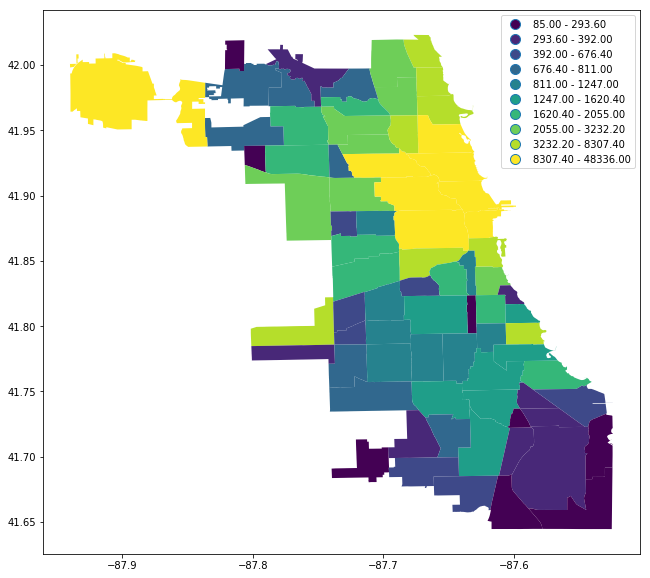

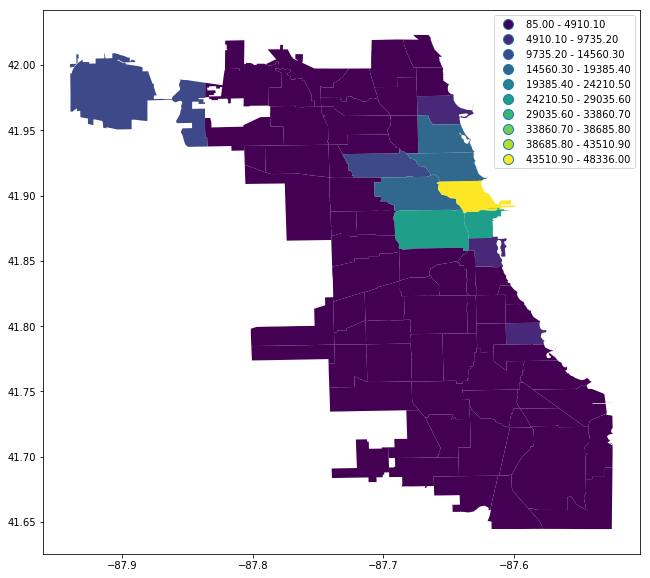

In [70]:
chicago.plot(column='pickup_number', scheme='quantiles', k=10, legend=True, figsize=(20,10))
chicago.plot(column='pickup_number', scheme='equal_interval', k=10, legend=True, figsize=(20,10))
plt.show()

# Chicago pickups vs dropoffs

In [71]:
chicago.head()

,community,area,shape_area,perimeter,area_num_1,area_numbe,comarea_id,comarea,shape_len,geometry,community_area,pickup_number,dropoff_number,center
0,DOUGLAS,0,46004621.1581,0,35,35,0,0,31027.0545098,(POLYGON ((-87.60914087617894 41.8446925026539...,35,2071,2053,POINT (-87.61867772050564 41.83511834262318)
1,OAKLAND,0,16913961.0408,0,36,36,0,0,19565.5061533,(POLYGON ((-87.59215283879394 41.8169293462668...,36,347,359,POINT (-87.60321641296161 41.8237503457304)
2,FULLER PARK,0,19916704.8692,0,37,37,0,0,25339.0897503,(POLYGON ((-87.62879823733725 41.8018930336891...,37,278,250,POINT (-87.63242456957649 41.8090854843581)
3,GRAND BOULEVARD,0,48492503.1554,0,38,38,0,0,28196.8371573,(POLYGON ((-87.6067081256125 41.81681377057218...,38,1659,1511,POINT (-87.6178596907689 41.81294935894828)
4,KENWOOD,0,29071741.9283,0,39,39,0,0,23325.1679062,(POLYGON ((-87.59215283879394 41.8169293462668...,39,1427,1408,POINT (-87.59618357877342 41.80891637016686)


In [72]:
chicago['pickup_dropoff'] = chicago['pickup_number'] - chicago['dropoff_number']

In [73]:
chicago['pickup_dropoff'].min()

-4388

# Set new grid on Chicago

### Create chicago grid

In [74]:
locationsdf = df[['Trip Start Timestamp', 'Trip Seconds', 'Trip Miles', 'Trip Total', 'Pickup Centroid Location', 'Dropoff Centroid Location']]


In [75]:
locationsdf = locationsdf.dropna()

pickup_df = locationsdf[['Trip Start Timestamp', 'Trip Seconds', 'Trip Miles', 'Trip Total', 'Pickup Centroid Location']]
dropoff_df = locationsdf[['Trip Start Timestamp', 'Trip Seconds', 'Trip Miles', 'Trip Total', 'Dropoff Centroid Location']]



In [76]:
pickup_df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 261891 entries, 2 to 299999
Data columns (total 5 columns):
Trip Start Timestamp        261891 non-null datetime64[ns]
Trip Seconds                261891 non-null int64
Trip Miles                  261891 non-null float64
Trip Total                  261891 non-null float64
Pickup Centroid Location    261891 non-null object
dtypes: datetime64[ns](1), float64(2), int64(1), object(1)
memory usage: 12.0+ MB


In [77]:
dropoff_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 261891 entries, 2 to 299999
Data columns (total 5 columns):
Trip Start Timestamp         261891 non-null datetime64[ns]
Trip Seconds                 261891 non-null int64
Trip Miles                   261891 non-null float64
Trip Total                   261891 non-null float64
Dropoff Centroid Location    261891 non-null object
dtypes: datetime64[ns](1), float64(2), int64(1), object(1)
memory usage: 12.0+ MB


In [78]:
geometry = pickup_df['Pickup Centroid Location'].map(shapely.wkt.loads)
pickup_df = pickup_df.drop('Pickup Centroid Location', axis=1)
crs = {'init': 'epsg:4326'}
pickup_gdf = gpd.GeoDataFrame(pickup_df, crs=crs, geometry=geometry)

In [79]:
pickup_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 261891 entries, 2 to 299999
Data columns (total 5 columns):
Trip Start Timestamp    261891 non-null datetime64[ns]
Trip Seconds            261891 non-null int64
Trip Miles              261891 non-null float64
Trip Total              261891 non-null float64
geometry                261891 non-null object
dtypes: datetime64[ns](1), float64(2), int64(1), object(1)
memory usage: 12.0+ MB


In [80]:
geometry = dropoff_df['Dropoff Centroid Location'].map(shapely.wkt.loads)
dropoff_df = dropoff_df.drop('Dropoff Centroid Location', axis=1)
crs = {'init': 'epsg:4326'}
dropoff_gdf = gpd.GeoDataFrame(dropoff_df, crs=crs, geometry=geometry)

In [81]:
dropoff_gdf.head()

,Trip Start Timestamp,Trip Seconds,Trip Miles,Trip Total,geometry
2,2018-11-01,558,2.6,10.0,POINT (-87.6318639497 41.8920421365)
3,2018-11-01,299,1.8,7.5,POINT (-87.66905440319999 41.6897299145)
4,2018-11-01,472,4.0,10.0,POINT (-87.6566440918 41.9425851797)
5,2018-11-01,1077,6.7,7.5,POINT (-87.6525344838 41.8926581076)
6,2018-11-01,697,4.6,12.5,POINT (-87.65156259219999 41.9363101308)


In [82]:
xmin,ymin,xmax,ymax =  pickup_gdf.total_bounds
#xmind,ymind,xmaxd,ymaxd =  dropoff_gdf.total_bounds

In [83]:
xmin,ymin,xmax,ymax

(-87.913624596, 41.6502216756, -87.5349029012, 42.0212235931)

In [84]:
width = 1/300
height = 1/300

cols = np.array(np.arange(xmin, xmax, width))
rows = np.array(np.arange(ymin, ymax, height))


polygons = []
for x in cols:
    for y in rows:
        polygons.append( Polygon([(x,y), (x+width, y), (x+width, y-height), (x, y-height)]) )

grid = gpd.GeoDataFrame({'geometry':polygons})

In [85]:
len(grid)

12768

In [86]:
grid.head()

,geometry
0,"POLYGON ((-87.91362459600001 41.6502216756, -8..."
1,POLYGON ((-87.91362459600001 41.65355500893333...
2,POLYGON ((-87.91362459600001 41.65688834226666...
3,POLYGON ((-87.91362459600001 41.66022167559999...
4,POLYGON ((-87.91362459600001 41.66355500893332...


In [87]:
pickup_gdf.head()

,Trip Start Timestamp,Trip Seconds,Trip Miles,Trip Total,geometry
2,2018-11-01,558,2.6,10.0,POINT (-87.65400702860001 41.9147473049)
3,2018-11-01,299,1.8,7.5,POINT (-87.66905440319999 41.6897299145)
4,2018-11-01,472,4.0,10.0,POINT (-87.63576009010001 41.9074919303)
5,2018-11-01,1077,6.7,7.5,POINT (-87.66386549560001 41.9726679555)
6,2018-11-01,697,4.6,12.5,POINT (-87.61971067170001 41.8950334495)


In [88]:
grid.crs = {'init': 'epsg:4326'}

In [89]:
grid.crs

{'init': 'epsg:4326'}

# Adding grids to our dropoff df (Sjoin)

In [90]:
dropoff_gridaera = gpd.sjoin(dropoff_gdf, grid, op = "within")

In [91]:
dropoff_gridaera.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 260426 entries, 2 to 290317
Data columns (total 6 columns):
Trip Start Timestamp    260426 non-null datetime64[ns]
Trip Seconds            260426 non-null int64
Trip Miles              260426 non-null float64
Trip Total              260426 non-null float64
geometry                260426 non-null object
index_right             260426 non-null int64
dtypes: datetime64[ns](1), float64(2), int64(2), object(1)
memory usage: 13.9+ MB


In [92]:
dropoff_gridaera.tail(5)  #gris number as additional index here

,Trip Start Timestamp,Trip Seconds,Trip Miles,Trip Total,geometry,index_right
280992,2018-11-01 23:15:00,2212,9.8,10.0,POINT (-87.780270163 41.9201527839),4561
283310,2018-11-01 23:30:00,806,5.4,7.5,POINT (-87.5399158012 41.7136552552),12564
288565,2018-11-02 00:00:00,1513,8.4,12.5,POINT (-87.76142159370001 41.9297962382),5124
289705,2018-11-02 00:00:00,1625,11.6,22.5,POINT (-87.76142159370001 41.9297962382),5124
290317,2018-11-02 00:15:00,1339,8.1,10.0,POINT (-87.76142159370001 41.9297962382),5124


In [93]:
dropoff_gridnum = pd.DataFrame(dropoff_gridaera.groupby('index_right').size())

In [94]:
dropoff_gridnum.columns = ['number_dropoffs']

In [95]:
dropoff_gridnum.head()

,number_dropoffs
index_right,
435,5881
443,2
1220,137
2338,5
2452,221


In [96]:
grid_dropoffs = grid.join(dropoff_gridnum, how='outer')

In [97]:
grid_dropoffs = grid_dropoffs.dropna()

In [98]:
grid_dropoffs = grid_dropoffs.reset_index()

In [99]:
grid_dropoffs.head()

,index,geometry,number_dropoffs
0,435,"POLYGON ((-87.90362459600001 41.9802216755997,...",5881.0
1,443,POLYGON ((-87.90362459600001 42.00688834226634...,2.0
2,1220,"POLYGON ((-87.8802912626667 41.98355500893303,...",137.0
3,2338,"POLYGON ((-87.8469579293334 41.97688834226637,...",5.0
4,2452,POLYGON ((-87.84362459600007 41.98355500893303...,221.0


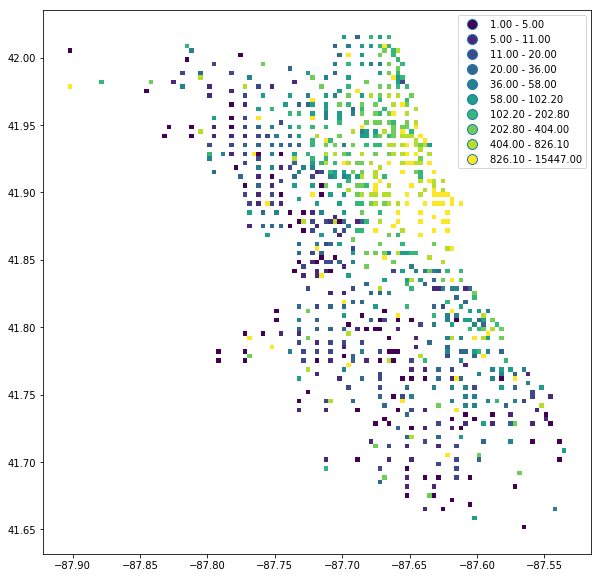

In [100]:
grid_dropoffs.plot(column='number_dropoffs', scheme='quantiles', k=10, legend=True, figsize=(20,10))
plt.show()

In [101]:
grid_dropoffs.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 798 entries, 0 to 797
Data columns (total 3 columns):
index              798 non-null int64
geometry           798 non-null object
number_dropoffs    798 non-null float64
dtypes: float64(1), int64(1), object(1)
memory usage: 18.8+ KB


#### Folium Dropoff Choropleth

In [102]:
bins = list(grid_dropoffs['number_dropoffs'].quantile([0, 0.8, 0.85, 0.89, 0.95, 0.97, 0.98, 0.99, 0.998, 1]))

In [103]:
chicago_center = [41.8781, -87.6298]

dropoff_grid_map = folium.Map(location = chicago_center, zoom_start = 12)

In [104]:
folium.Choropleth(
    geo_data=grid_dropoffs,
    name='geometry',
    data=grid_dropoffs,
    columns= ['index', 'number_dropoffs'],
    key_on='feature.properties.index',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.5,
    legend_name='Dropoff dencity',
    bins=bins,
    reset=True
).add_to(dropoff_grid_map)

In [105]:
folium.LayerControl().add_to(dropoff_grid_map)

In [107]:
display(dropoff_grid_map)

In [108]:
places = pd.read_csv('/Users/alex/Library/Mobile Documents/com~apple~CloudDocs/Datasets/Places_chicago.csv')

In [109]:
places.head()

,Place,Coordinates
0,Millennium Park,41.882600 -87.622600
1,The Art Institute of Chicago,41.879600 -87.623700
2,Lincoln Park Zoo,41.921100 -87.633500
3,Garfield Park Conservatory,41.886300 -87.717300
4,Wrigley Field,41.948400 -87.655300


In [110]:
places = places.join(places.Coordinates.str.split(expand=True))
places = places.drop('Coordinates', axis=1)


In [111]:
places.head()

,Place,0,1
0,Millennium Park,41.882600,-87.622600
1,The Art Institute of Chicago,41.879600,-87.623700
2,Lincoln Park Zoo,41.921100,-87.633500
3,Garfield Park Conservatory,41.886300,-87.717300
4,Wrigley Field,41.948400,-87.655300


In [112]:
places.columns = ['places', 'lat', 'lng']

In [113]:
places.lat = places.lat.astype(float)
places.lng = places.lng.astype(float)

In [114]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23 entries, 0 to 22
Data columns (total 3 columns):
places    23 non-null object
lat       23 non-null float64
lng       23 non-null float64
dtypes: float64(2), object(1)
memory usage: 632.0+ bytes


 - add popular places
 - Analysis of night rides

In [115]:
geometry = [Point(xy) for xy in zip (places.lng, places.lat)]

In [116]:
places_gdf = gpd.GeoDataFrame(places, geometry=geometry)



In [117]:
places_gdf.head()

,places,lat,lng,geometry
0,Millennium Park,41.8826,-87.6226,POINT (-87.62260000000001 41.8826)
1,The Art Institute of Chicago,41.8796,-87.6237,POINT (-87.6237 41.8796)
2,Lincoln Park Zoo,41.9211,-87.6335,POINT (-87.6335 41.9211)
3,Garfield Park Conservatory,41.8863,-87.7173,POINT (-87.71729999999999 41.8863)
4,Wrigley Field,41.9484,-87.6553,POINT (-87.6553 41.9484)


In [118]:
for row in places_gdf.iterrows():
    row_values = row[1] 
    center_point = row_values['geometry']
    location = [center_point.y, center_point.x]
    popup = (str(row_values['places']))
    marker = folium.Marker(location = location, popup = popup)
    marker.add_to(dropoff_grid_map)

In [119]:
display(dropoff_grid_map)

In [120]:
grid_dropoffs.number_dropoffs.sum()

260426.0

In [155]:
len(grid_dropoffs)

798

In [156]:
df['Dropoff Centroid Location'].nunique()

828

In [157]:
df['Pickup Centroid Location'].nunique()

829

# Dropoffs with more than 2000

In [121]:
grid_dropoffs_max = grid_dropoffs[grid_dropoffs.number_dropoffs > 2000]

In [122]:
len(grid_dropoffs_max)

25

In [123]:
grid_dropoffs_max.number_dropoffs.sum()

103127.0

# Origin destination

In [124]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300000 entries, 0 to 299999
Data columns (total 21 columns):
Trip Start Timestamp          300000 non-null datetime64[ns]
Trip End Timestamp            300000 non-null datetime64[ns]
Trip Seconds                  300000 non-null int64
Trip Miles                    300000 non-null float64
Pickup Census Tract           210676 non-null float64
Dropoff Census Tract          209071 non-null float64
Pickup Community Area         281992 non-null float64
Dropoff Community Area        279447 non-null float64
Fare                          300000 non-null float64
Tip                           300000 non-null int64
Additional Charges            300000 non-null float64
Trip Total                    300000 non-null float64
Shared Trip Authorized        300000 non-null bool
Trips Pooled                  300000 non-null int64
Pickup Centroid Latitude      282149 non-null float64
Pickup Centroid Longitude     282149 non-null float64
Pickup Centroid Loca

In [125]:
df_odm = df.drop(['Trip End Timestamp', 'Pickup Census Tract', 'Dropoff Census Tract', 'Pickup Community Area', 'Dropoff Community Area',
'Shared Trip Authorized', 'Trips Pooled', 'Pickup Centroid Latitude', 'Pickup Centroid Longitude', 'Dropoff Centroid Latitude',
'Dropoff Centroid Longitude'], axis=1)




In [126]:
df_odm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300000 entries, 0 to 299999
Data columns (total 10 columns):
Trip Start Timestamp         300000 non-null datetime64[ns]
Trip Seconds                 300000 non-null int64
Trip Miles                   300000 non-null float64
Fare                         300000 non-null float64
Tip                          300000 non-null int64
Additional Charges           300000 non-null float64
Trip Total                   300000 non-null float64
Pickup Centroid Location     282149 non-null object
Dropoff Centroid Location    279606 non-null object
velocity                     299999 non-null float64
dtypes: datetime64[ns](1), float64(5), int64(2), object(2)
memory usage: 22.9+ MB


### Exclude rideswith out pickup and dropoff

In [127]:
df_odm_ready = df_odm[df_odm['Pickup Centroid Location'].notnull() & df_odm['Dropoff Centroid Location'].notnull()]

In [128]:
df_odm_ready.head()

,Trip Start Timestamp,Trip Seconds,Trip Miles,Fare,Tip,Additional Charges,Trip Total,Pickup Centroid Location,Dropoff Centroid Location,velocity
2,2018-11-01,558,2.6,7.5,0,2.5,10.0,POINT (-87.6540070286 41.9147473049),POINT (-87.6318639497 41.8920421365),16.774194
3,2018-11-01,299,1.8,5.0,0,2.5,7.5,POINT (-87.6690544032 41.6897299145),POINT (-87.6690544032 41.6897299145),21.672241
4,2018-11-01,472,4.0,7.5,0,2.5,10.0,POINT (-87.6357600901 41.9074919303),POINT (-87.6566440918 41.9425851797),30.508475
5,2018-11-01,1077,6.7,5.0,0,2.5,7.5,POINT (-87.6638654956 41.9726679555),POINT (-87.6525344838 41.8926581076),22.395543
6,2018-11-01,697,4.6,10.0,0,2.5,12.5,POINT (-87.6197106717 41.8950334495),POINT (-87.6515625922 41.9363101308),23.758967


In [129]:
df_odm_ready2 = df_odm_ready.copy()

In [130]:
geometry_p = df_odm_ready['Pickup Centroid Location'].map(shapely.wkt.loads)
#geometry_d = df_odm_ready['Dropoff Centroid Location'].map(shapely.wkt.loads)
#df_odm_ready = df_odm_ready.drop(['Pickup Centroid Location', 'Dropoff Centroid Location'], axis=1)
crs = {'init': 'epsg:4326'}
df_odm_pick = gpd.GeoDataFrame(df_odm_ready, crs=crs, geometry=geometry_p) # NOTE changes main df

In [131]:
df_odm_ready2.head()

,Trip Start Timestamp,Trip Seconds,Trip Miles,Fare,Tip,Additional Charges,Trip Total,Pickup Centroid Location,Dropoff Centroid Location,velocity
2,2018-11-01,558,2.6,7.5,0,2.5,10.0,POINT (-87.6540070286 41.9147473049),POINT (-87.6318639497 41.8920421365),16.774194
3,2018-11-01,299,1.8,5.0,0,2.5,7.5,POINT (-87.6690544032 41.6897299145),POINT (-87.6690544032 41.6897299145),21.672241
4,2018-11-01,472,4.0,7.5,0,2.5,10.0,POINT (-87.6357600901 41.9074919303),POINT (-87.6566440918 41.9425851797),30.508475
5,2018-11-01,1077,6.7,5.0,0,2.5,7.5,POINT (-87.6638654956 41.9726679555),POINT (-87.6525344838 41.8926581076),22.395543
6,2018-11-01,697,4.6,10.0,0,2.5,12.5,POINT (-87.6197106717 41.8950334495),POINT (-87.6515625922 41.9363101308),23.758967


In [132]:
geometry_d = df_odm_ready['Dropoff Centroid Location'].map(shapely.wkt.loads)
crs = {'init': 'epsg:4326'}
df_odm_drop = gpd.GeoDataFrame(df_odm_ready2, crs=crs, geometry=geometry_d)

### Pickup geodataframe

In [133]:
df_odm_pick.head()

,Trip Start Timestamp,Trip Seconds,Trip Miles,Fare,Tip,Additional Charges,Trip Total,Pickup Centroid Location,Dropoff Centroid Location,velocity,geometry
2,2018-11-01,558,2.6,7.5,0,2.5,10.0,POINT (-87.6540070286 41.9147473049),POINT (-87.6318639497 41.8920421365),16.774194,POINT (-87.65400702860001 41.9147473049)
3,2018-11-01,299,1.8,5.0,0,2.5,7.5,POINT (-87.6690544032 41.6897299145),POINT (-87.6690544032 41.6897299145),21.672241,POINT (-87.66905440319999 41.6897299145)
4,2018-11-01,472,4.0,7.5,0,2.5,10.0,POINT (-87.6357600901 41.9074919303),POINT (-87.6566440918 41.9425851797),30.508475,POINT (-87.63576009010001 41.9074919303)
5,2018-11-01,1077,6.7,5.0,0,2.5,7.5,POINT (-87.6638654956 41.9726679555),POINT (-87.6525344838 41.8926581076),22.395543,POINT (-87.66386549560001 41.9726679555)
6,2018-11-01,697,4.6,10.0,0,2.5,12.5,POINT (-87.6197106717 41.8950334495),POINT (-87.6515625922 41.9363101308),23.758967,POINT (-87.61971067170001 41.8950334495)


### Dropoff Geodataframe

In [134]:
df_odm_drop.head()

,Trip Start Timestamp,Trip Seconds,Trip Miles,Fare,Tip,Additional Charges,Trip Total,Pickup Centroid Location,Dropoff Centroid Location,velocity,geometry
2,2018-11-01,558,2.6,7.5,0,2.5,10.0,POINT (-87.6540070286 41.9147473049),POINT (-87.6318639497 41.8920421365),16.774194,POINT (-87.6318639497 41.8920421365)
3,2018-11-01,299,1.8,5.0,0,2.5,7.5,POINT (-87.6690544032 41.6897299145),POINT (-87.6690544032 41.6897299145),21.672241,POINT (-87.66905440319999 41.6897299145)
4,2018-11-01,472,4.0,7.5,0,2.5,10.0,POINT (-87.6357600901 41.9074919303),POINT (-87.6566440918 41.9425851797),30.508475,POINT (-87.6566440918 41.9425851797)
5,2018-11-01,1077,6.7,5.0,0,2.5,7.5,POINT (-87.6638654956 41.9726679555),POINT (-87.6525344838 41.8926581076),22.395543,POINT (-87.6525344838 41.8926581076)
6,2018-11-01,697,4.6,10.0,0,2.5,12.5,POINT (-87.6197106717 41.8950334495),POINT (-87.6515625922 41.9363101308),23.758967,POINT (-87.65156259219999 41.9363101308)


### Grid

In [135]:
xmin,ymin,xmax,ymax =  df_odm_pick.total_bounds


In [136]:
xmin,ymin,xmax,ymax

(-87.913624596, 41.6502216756, -87.5349029012, 42.0212235931)

In [137]:
width = 1/30
height = 1/30

cols = np.array(np.arange(xmin, xmax, width))
rows = np.array(np.arange(ymin, ymax, height))


polygons = []
for x in cols:
    for y in rows:
        polygons.append( Polygon([(x,y), (x+width, y), (x+width, y-height), (x, y-height)]) )

grid_odm = gpd.GeoDataFrame({'geometry':polygons})

In [138]:
len(grid_odm)

144

### Adding crs

In [139]:
grid_odm.crs = {'init': 'epsg:4326'}

In [140]:
df_odm_pick.crs

{'init': 'epsg:4326'}

In [141]:
df_odm_drop.crs

{'init': 'epsg:4326'}

### SJOIN Grid and Pickup

In [142]:
df_odm_pick_grid = gpd.sjoin(df_odm_pick, grid_odm, op = "within")

In [143]:
df_odm_drop_grid = gpd.sjoin(df_odm_drop, grid_odm, op = "within")

In [144]:
df_odm_pick_grid.head()

,Trip Start Timestamp,Trip Seconds,Trip Miles,Fare,Tip,Additional Charges,Trip Total,Pickup Centroid Location,Dropoff Centroid Location,velocity,geometry,index_right
2,2018-11-01,558,2.6,7.5,0,2.5,10.0,POINT (-87.6540070286 41.9147473049),POINT (-87.6318639497 41.8920421365),16.774194,POINT (-87.65400702860001 41.9147473049),92
28,2018-11-01,832,4.2,10.0,0,2.5,12.5,POINT (-87.6572331997 41.8852813201),POINT (-87.6467820813 41.938232293),18.173077,POINT (-87.6572331997 41.8852813201),92
31,2018-11-01,430,1.5,5.0,5,2.5,12.5,POINT (-87.6753116216 41.906025969),POINT (-87.6997544065 41.9211259143),12.558140,POINT (-87.6753116216 41.906025969),92
33,2018-11-01,857,6.3,2.5,0,2.5,5.0,POINT (-87.6647458359 41.8924931672),POINT (-87.6532439924 41.9528229157),26.464411,POINT (-87.66474583590001 41.8924931672),92
36,2018-11-01,508,2.1,5.0,0,2.5,7.5,POINT (-87.6540070286 41.9147473049),POINT (-87.6378442095 41.8932163595),14.881890,POINT (-87.65400702860001 41.9147473049),92


In [145]:
df_odm_drop_grid.head()

,Trip Start Timestamp,Trip Seconds,Trip Miles,Fare,Tip,Additional Charges,Trip Total,Pickup Centroid Location,Dropoff Centroid Location,velocity,geometry,index_right
2,2018-11-01,558,2.6,7.5,0,2.5,10.0,POINT (-87.6540070286 41.9147473049),POINT (-87.6318639497 41.8920421365),16.774194,POINT (-87.6318639497 41.8920421365),104
13,2018-11-01,303,1.0,5.0,0,2.5,7.5,POINT (-87.6378442095 41.8932163595),POINT (-87.6321092196 41.9002656868),11.881188,POINT (-87.6321092196 41.9002656868),104
15,2018-11-01,300,1.0,5.0,0,2.5,7.5,POINT (-87.6188683546 41.8909220259),POINT (-87.6378442095 41.8932163595),12.000000,POINT (-87.6378442095 41.8932163595),104
24,2018-11-01,151,0.6,2.5,0,2.5,5.0,POINT (-87.6428084655 41.8853000224),POINT (-87.6378442095 41.8932163595),14.304636,POINT (-87.6378442095 41.8932163595),104
25,2018-11-01,441,1.1,5.0,0,2.5,7.5,POINT (-87.6318639497 41.8920421365),POINT (-87.6207628651 41.8983317935),8.979592,POINT (-87.62076286510001 41.8983317935),104


### Join by index

In [146]:
df_odm_drop_grid = df_odm_drop_grid.drop(['Trip Start Timestamp', 'Trip Seconds', 'Trip Miles', 'Fare', 'Tip',
       'Additional Charges', 'Trip Total', 'Pickup Centroid Location','Dropoff Centroid Location', 'velocity'], axis=1)

In [147]:
df_odm_drop_grid.head()

,geometry,index_right
2,POINT (-87.6318639497 41.8920421365),104
13,POINT (-87.6321092196 41.9002656868),104
15,POINT (-87.6378442095 41.8932163595),104
24,POINT (-87.6378442095 41.8932163595),104
25,POINT (-87.62076286510001 41.8983317935),104


In [148]:
df_omd_grid = pd.merge(df_odm_pick_grid, df_odm_drop_grid, right_index=True, left_index=True)

In [149]:
df_omd_grid = df_omd_grid.drop(['Trip Start Timestamp', 'Trip Seconds', 'Trip Miles', 'Fare', 'Tip',
       'Additional Charges', 'Trip Total', 'Pickup Centroid Location',
       'Dropoff Centroid Location', 'velocity', 'geometry_x', 'geometry_y'], axis=1)

In [150]:
df_omd_grid['value'] = 1

In [151]:
df_omd_grid.columns

Index(['index_right_x', 'index_right_y', 'value'], dtype='object')

In [152]:
df_omd_grid.head()

,index_right_x,index_right_y,value
2,92,104,1
28,92,105,1
31,92,81,1
33,92,94,1
36,92,104,1


In [153]:
odm_matrix = df_omd_grid.pivot_table(index='index_right_x', columns='index_right_y', values='value', aggfunc=np.sum).fillna(0)

In [154]:
odm_matrix

index_right_y,10,11,22,33,34,35,40,44,45,46,...,113,114,116,121,122,123,124,133,134,135
index_right_x,,,,,,,,,,,,,,,,,,,,,
10,48.0,0.0,48.0,0.0,64.0,0.0,0.0,1.0,4.0,3.0,...,72.0,6.0,55.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0
22,40.0,0.0,19.0,0.0,12.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
33,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
34,69.0,2.0,15.0,2.0,20.0,4.0,0.0,0.0,3.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
35,4.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,6.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
40,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
44,4.0,0.0,0.0,0.0,2.0,0.0,0.0,1.0,0.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
45,10.0,0.0,0.0,0.0,3.0,4.0,0.0,4.0,130.0,8.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
